In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [58]:
traj = np.load('../unformatted_traj.npy')

In [59]:
xcom = (traj[::3].mean(1)).mean()
ycom = (traj[1::3].mean(1)).mean()
zcom = (traj[2::3].mean(1)).mean()

In [60]:
Rgx = np.zeros(traj.shape[1])
Rgy = np.zeros(traj.shape[1])
Rgz = np.zeros(traj.shape[1])

for i in range(0, 3*76, 3):
    Rgx += (traj[i,:] - xcom)**2
    Rgy += (traj[i + 1,:] - ycom)**2
    Rgz += (traj[i + 2,:] - zcom)**2
Rgx = np.sqrt(Rgx / (traj.shape[0] // 3))
Rgy = np.sqrt(Rgy / (traj.shape[0] // 3))
Rgz = np.sqrt(Rgz / (traj.shape[0] // 3))

Rg = np.sqrt(Rgx**2 + Rgy**2 + Rgz**2)

In [6]:
xi1_list = []
for k in [1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(k)

    QT = np.load('../' + str(k) + 'ns/com_Rmatrix.npy').T
    dtraj = np.copy(traj[:,:int(5*1000*k)])
    avg_coor = np.mean(dtraj, axis = 1)
    for i in range(dtraj.shape[0]):   
        dtraj[i,:] -=  avg_coor[i]
    xi1 = np.matmul(QT[0,:], dtraj)
    xi1_list.append(xi1)

1
10
25
50
100
200
300
400
500
600
700
800
900


In [63]:
xi1HA_list = []
for k in [1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(k)

    QT = np.load('../' + str(k) + 'ns/com_HCINVmatrix.npy')
    dtraj = np.copy(traj[:,:int(5*1000*k)])
    avg_coor = np.mean(dtraj, axis = 1)
    for i in range(dtraj.shape[0]):   
        dtraj[i,:] -=  avg_coor[i]
    xi1 = np.matmul(QT[0,:], dtraj)
    xi1HA_list.append(xi1)

1
10
25
50
100
200
300
400
500
600
700
800
900


In [56]:
xi2_list = []
for k in [1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]:
    print(k)

    QT = np.load('../' + str(k) + 'ns/com_Rmatrix.npy').T
    dtraj = np.copy(traj[:,:int(5*1000*k)])
    avg_coor = np.mean(dtraj, axis = 1)
    for i in range(dtraj.shape[0]):   
        dtraj[i,:] -=  avg_coor[i]
    xi2 = np.matmul(QT[1,:], dtraj)
    xi2_list.append(xi2)

1
10
25
50
100
200
300
400
500
600
700
800
900


In [83]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1_list[i], Rg[:int(5*1000*k)]))[0,1])

0.5828860441499765
0.6656946193861953
0.5078081894601769
0.5254429529220257
0.6018108722901737
0.4202217513755043
0.41143368257236246
0.6193136733024027
0.5932489943728453
0.5927635831223828
0.6326811174885708
0.6347990382559529
0.5914768555606561


In [64]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1HA_list[i], Rg[:int(5*1000*k)]))[0,1])

0.16348782868668502
0.6986773144044687
0.4254155692930516
0.4916784336248963
0.5595918058003898
0.3997958455530905
0.00015792095593910704
0.5780328214862172
0.5477617528743053
0.5403273915339719
0.6020273849419774
0.6032563224558274
0.5646738691164114


In [61]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi2_list[i], Rg[:int(5*1000*k)]))[0,1])

0.27281828681108883
0.18751432088879275
0.46349509192033833
0.1516717235633992
0.24585704772460654
0.14066287999370286
0.13448302893726863
0.2477442669867433
0.2537562135905576
0.1649604217654047
0.11809389742872645
0.12017386781554026
0.04414485873924874


In [11]:
RMSD = np.zeros(traj.shape[1])
r0 = traj[:,0]

for k in range(traj.shape[1]):
    RMSD[k] = np.dot((traj[:, k] - r0), (traj[:, k] - r0))

In [12]:
RMSD = np.sqrt(RMSD / (traj.shape[0] // 3))

In [84]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1_list[i], RMSD[:int(5*1000*k)]))[0,1])

0.5384003017814162
0.9409638518677328
0.7345973184268468
0.8634024047091039
0.9048169669003084
0.9102284752388832
0.825881957404253
0.7279575270212877
0.7304904378151066
0.7829788832159158
0.7778850803800258
0.7861603723415375
0.8139826712500946


In [65]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1HA_list[i], RMSD[:int(5*1000*k)]))[0,1])

0.04655984181553148
0.8920790169777667
0.6504170010431496
0.558038998733306
0.847764768985536
0.8883119615187813
0.00023513268112751294
0.6976189530144737
0.6935830512127524
0.7552244078152655
0.7518603583376845
0.7592871715577174
0.7928488459357917


In [62]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi2_list[i], RMSD[:int(5*1000*k)]))[0,1])

0.35177089813247975
0.007960761745754736
0.20422241928409435
0.10209124024491768
0.05387949783135479
0.024734751689190107
0.02472080331499846
0.17469566777849832
0.20663650359639948
0.1640207951317603
0.04533240080296817
0.030512638717842357
0.04466984969992009


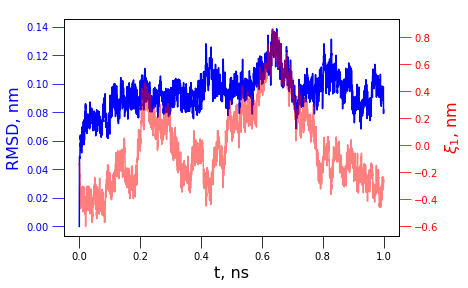

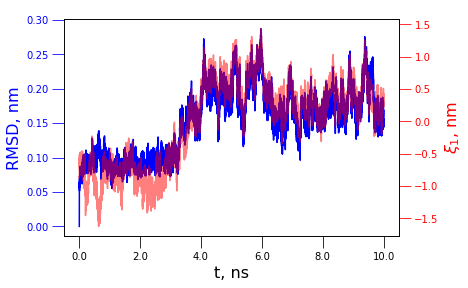

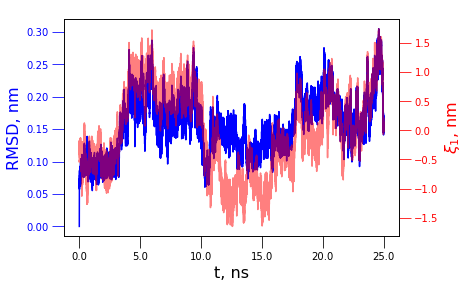

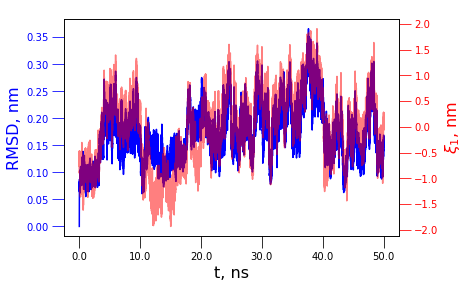

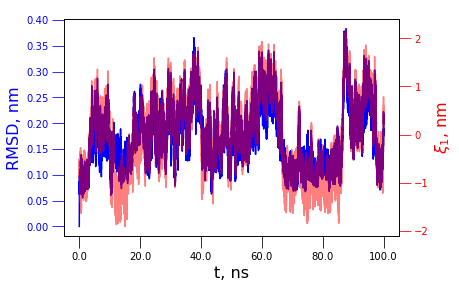

...

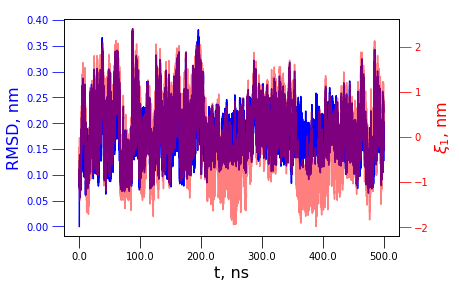

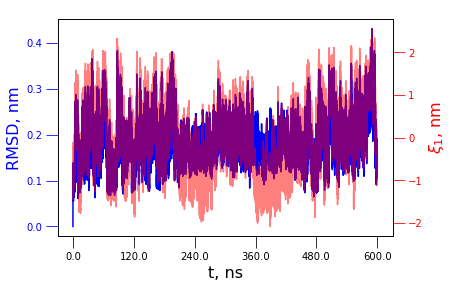

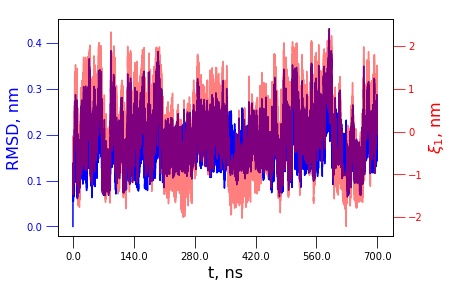

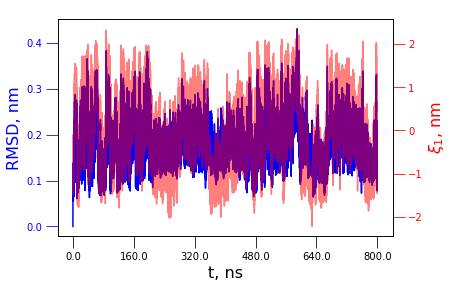

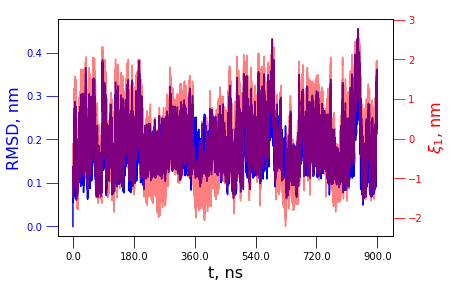

In [55]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    fig, ax0 = plt.subplots()
    ax1 = ax0.twinx()
    ax0.plot(RMSD[:int(5*1000*k)], c = 'b')
    ax0.set_xlabel('t, ns', fontsize = 16)
    ax0.tick_params(size = 12)
    ax0.tick_params(axis = 'y', color = 'b', size = 12, labelcolor = 'b')
    ax0.set_ylabel('RMSD, nm', fontsize = 16, color = 'b')
    ax0.set_xticks(list(np.linspace(0,int(5*1000*k), 6)))
    ax0.set_xticklabels(list(np.round(np.linspace(0,k, 6), 1)))
    ax1.plot(-1*xi1_list[i], c = 'r', alpha = 0.5)
    ax1.tick_params(axis = 'y', color = 'r', size = 12, labelcolor = 'r')
    ax1.set_ylabel(r'$\xi_1$, nm', fontsize = 16, color = 'r')
    plt.show()
    plt.close()

In [8]:
slices = [1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]
RMSD_list = []
for i in slices:
    print(i)
    RMSD_avg = np.zeros(traj[:,:int(5*1000*i)].shape[1])
    r0 = traj[:,:int(5*1000*i)].mean(1)
    for k in range(traj[:,:int(5*1000*i)].shape[1]):
        RMSD_avg[k] = np.dot((traj[:, k] - r0), (traj[:, k] - r0))
    RMSD_list.append(RMSD_avg)

1
10
25
50
100
200
300
400
500
600
700
800
900


In [10]:
RMSD_list[-1]

array([1.15432126, 1.15171858, 1.14213082, ..., 2.51961957, 2.38054566,
       2.40834523])

In [9]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1_list[i], RMSD_list[i]))[0,1])

0.14186408646435603
0.17283122054647923
0.14134755831344684
0.006146610947203027
0.11800855316987204
0.1356281134974515
0.19417436799192786
0.0492213152932483
0.08298989279592481
0.13189770021183236
0.07754354556048114
0.062349220905893454
0.2050904017267513


In [66]:
Retex = np.zeros(traj.shape[1])
Retey = np.zeros(traj.shape[1])
Retez = np.zeros(traj.shape[1])

Retex = (traj[-3,:] - traj[0,:])
Retey = (traj[-2,:] - traj[1,:])
Retez = (traj[-1,:] - traj[2,:])

Rete = np.sqrt(Retex**2 + Retey**2 + Retez**2)

In [85]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1_list[i], Rete[:int(5*1000*k)]))[0,1])

0.7960462359601154
0.6390912770529668
0.4860522801184422
0.4616080863501844
0.5592703617514638
0.3392275542959702
0.2518723910985303
0.49645616496704686
0.4698903927155285
0.3969649093254928
0.49531951721559786
0.5124262023440497
0.4579139553585901


In [67]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi1HA_list[i], Rete[:int(5*1000*k)]))[0,1])

0.1615930889668755
0.6853678602711105
0.4012552066208373
0.3856272161492465
0.5510712529862574
0.31755962833014406
0.00011440760524440894
0.43684276800309657
0.4051051988641163
0.31809449890752833
0.455702940889014
0.4752234221631397
0.4235600002612387


In [68]:
for i, k in enumerate([1, 10, 25, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900]):

    print(abs(np.corrcoef(xi2_list[i], Rete[:int(5*1000*k)]))[0,1])

0.3462653714162776
0.35282481495588264
0.4573829860838242
0.1264103761909683
0.16698727027898216
0.04453115968209956
0.03584697750514542
0.17610330900163065
0.1820238649235219
0.079012261347516
0.008349063676962044
0.01285884675050361
0.03749674599152974


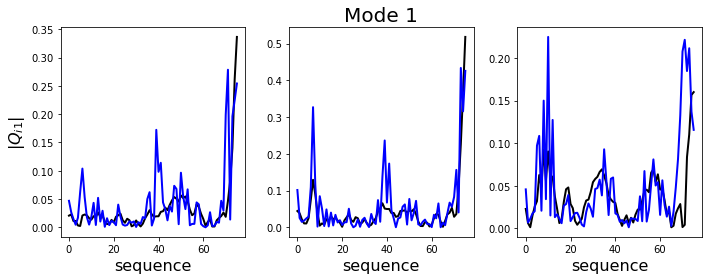

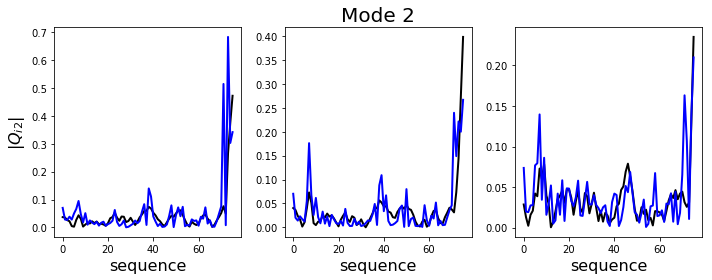

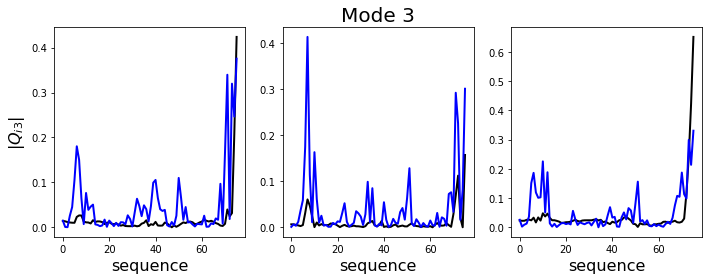

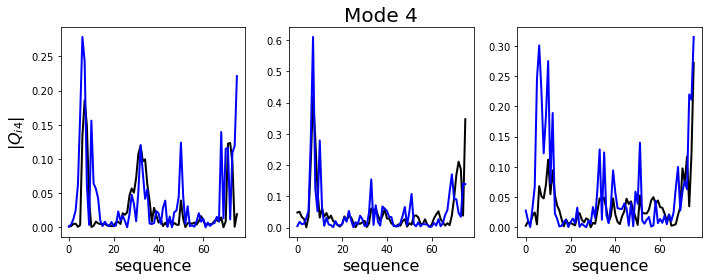

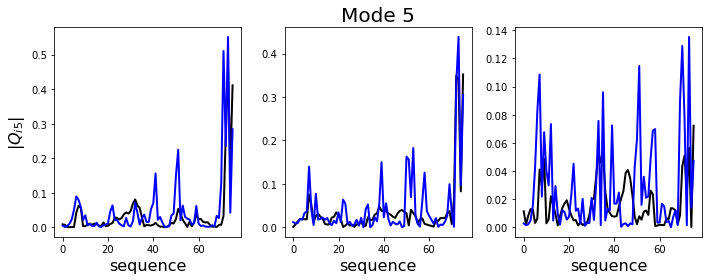

...

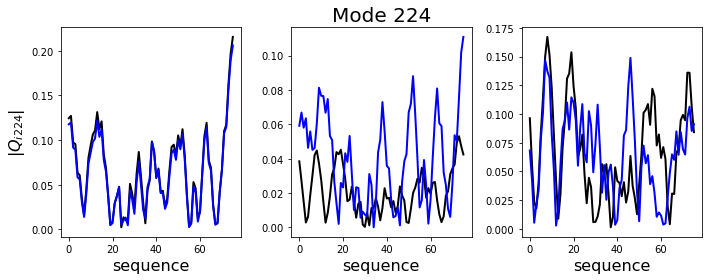

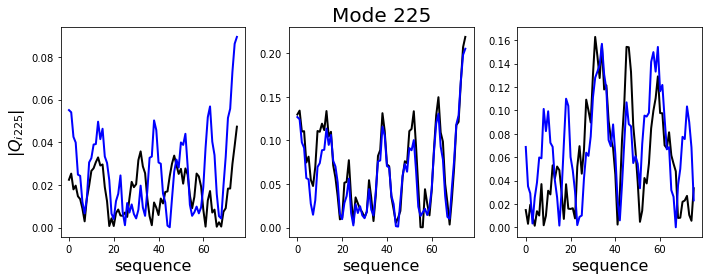

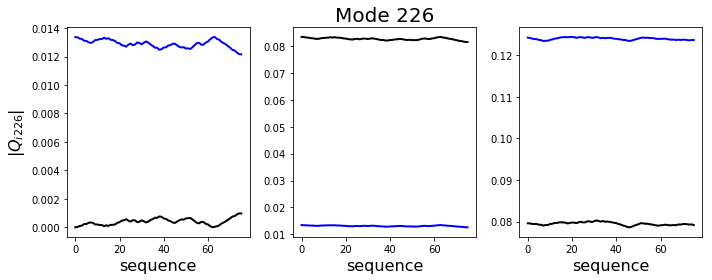

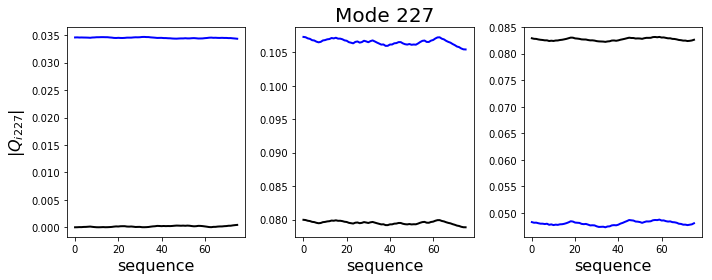

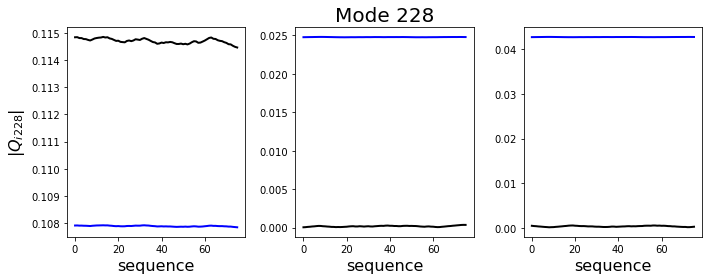

In [79]:
#### Compare left eigenvectors

QT = np.reshape(np.loadtxt('../com_RTmatrix'), (228, 228))
QINV = np.reshape(np.loadtxt('../com_HCINVmatrix'), (228, 228))

for i in range(QT.shape[0]):
    fig, axs = plt.subplots(1, 3, figsize = (10, 4))
    axs[0].plot(abs(QT[i,::3]), lw = 2, c = 'k')
    axs[0].plot(abs(QINV[i,::3]), lw = 2, c ='b')
    axs[0].set_xlabel('sequence', fontsize = 16)
    axs[0].set_ylabel(r'|$ Q_{i' + str(i + 1)  +'}$|', fontsize = 16)
    axs[1].plot(abs(QT[i,1::3]), lw = 2, c = 'k')
    axs[1].plot(abs(QINV[i,1::3]), lw = 2, c ='b')
    axs[1].set_xlabel('sequence', fontsize = 16)
    axs[1].set_title('Mode ' + str(i + 1), fontsize = 20)
    axs[2].plot(abs(QT[i,2::3]), lw = 2, c = 'k')
    axs[2].plot(abs(QINV[i,2::3]), lw = 2, c ='b')
    axs[2].set_xlabel('sequence', fontsize = 16)
    plt.tight_layout()
    plt.show()
    plt.close()